# Camera Calibration with RANSAC


### Description
We are going to deal with camera and scene geometry. Specifically, we will estimate the
camera projection matrix, which maps 3D world coordinates to image coordinates, as well as the fundamental matrix, which relates points in one scene to epipolar lines in another. The camera projection matrix and fundamental matrix can each be estimated using point correspondences. To estimate the projection matrix (camera calibration), the input is corresponding 3D and 2D points. To estimate the fundamental matrix the input is corresponding 2D points across two images.

The next part of the project involves estimating the fundamental matrix using RANSAC (already implemented by the TAs) and comparing the results of fundamental matrix estimation with and without RANSAC.


### Outline:

1. Camera Projection Matrix  
    - Calculate Projection Matrix
    - Projection
    - Calculate Camera Center
2. Fundamental Matrix Estimation
    - Normalize Points 
    - Unnormalize Fundamental Matrix
    - Estimate Fundamental Matrix
3. Fundamental Matrix with RANSAC
4. Visualization of Fundamental Matrix & Comparison of the results from (2) and (3)
    - Compute Fundamental RANSAC Matrix
5. Using F-Matrix Estimation with RANSAC for Visual Odometry
    - Get Visual Odometry
    - Compute Absolute Poses
6. gtSAM:
    - Compute gtSAM


## Setup

In [1]:
%matplotlib inline
%matplotlib notebook
%load_ext autoreload
%autoreload 2
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from utils import (
    verify,
    evaluate_points,
    visualize_points,
    visualize_points_image,
    plot3dview,
    load_image,
    draw_epipolar_lines,
    get_matches,
    show_correspondence2
)

## Camera Projection Matrix

The goal is to compute the projection matrix that goes from world 3D coordinates to 2D image coordinates.
Recall that using homogeneous coordinates the equation for moving from 3D world to 2D camera coordinates is:

\begin{equation}
\left(\begin{array}{l}
u \\
v \\
1
\end{array}\right) \cong\left(\begin{array}{c}
u * s \\
v * s \\
s
\end{array}\right)=\left(\begin{array}{llll}
m_{11} & m_{12} & m_{13} & m_{14} \\
m_{21} & m_{22} & m_{23} & m_{24} \\
m_{31} & m_{32} & m_{33} & m_{34}
\end{array}\right)\left(\begin{array}{l}
X \\
Y \\
Z \\
1
\end{array}\right)
\end{equation}

Here, $X, Y, Z$ are the world 3D coordinates and $u, v$ are the 2D image coordinates. To compute the projection matrix, we can rewrite the same equations as:

\begin{align}
\begin{gathered}
u=\frac{m_{11} X+m_{12} Y+m_{13} Z+m_{14}}{m_{31} X+m_{32} Y+m_{33} Z+m_{34}} \\
\rightarrow\left(m_{31} X+m_{32} Y+m_{33} Z+m_{34}\right) u=m_{11} X+m_{12} Y+m_{13} Z+m_{14} \\
\rightarrow 0=m_{11} X+m_{12} Y+m_{13} Z+m_{14}-m_{31} u X-m_{32} u Y-m_{33} u Z-m_{34} u \\
\rightarrow=\frac{m_{21} X+m_{22} Y+m_{23} Z+m_{24}}{m_{31} X+m_{32} Y+m_{33} Z+m_{34}} \\
\rightarrow\left(m_{31} X+m_{32} Y+m_{33} Z+m_{34}\right) v=m_{21} X+m_{22} Y+m_{23} Z+m_{24} \\
\rightarrow 0=m_{21} X+m_{22} Y+m_{23} Z+m_{24}-m_{31} v X-m_{32} v Y-m_{33} v Z-m_{34} v
\end{gathered}
\end{align}

We can thus set up a linear regression to find the elements of the matrix M. However, the matrix M is only defined up to a scale. Therefore, these equations have many different possible solutions (in particular M = all zeros is a solution, which is not very helpful in our context). We can solve this by fixing a scale and then doing the regression. One common way is to use the singular value decomposition to directly solve the constrained optimization problem:

\begin{equation}
\begin{array}{ll}
\arg \min _{x} & \|A x\| \\
\text { s.t. } & \|x\|=1
\end{array}
\end{equation}

The above equation can be solved using singular value decomposition. The solution to the above equation involves computing the SVD of A and then considering the last row of the $V$ matrix as the elements of the projection matrix (after reshaping). For those, who are interested in understanding the derivation for this logic, have a look at [Tom´aˇs Svoboda](http://cmp.felk.cvut.cz/cmp/courses/XE33PVR/WS20072008/Lectures/Supporting/constrained_lsq.pdf) lecture on "Least–squares Solution of Homogeneous Equations". 

### Calculate the camera center using M found from the previous step

Once you have an accurate projection matrix $M$, it is possible to tease it apart into the more familiar and more useful matrix $K$ of intrinsic parameters and matrix $[R \mid T]$ of extrinsic parameters. For this project, we will only ask you to estimate one particular extrinsic parameter: the camera center in world coordinates. Let us define $M$ as being composed of a $3 \times 3$ matrix, $Q$, and a 4th column, $m_{4}:$

$$
M=\left[\begin{array}{l}
Q & m_{4}
\end{array}\right]
$$
Now, the center of the camera $C$ could be found by:
$$
C=-Q^{-1} m_{4}
$$

We've also provided a visualization that will show the estimated $3 \mathrm{D}$ location of the camera with respect to the normalized $3 \mathrm{D}$ point coordinates.

### Calculating the projection matrix given corresponding 2D & 3D points

First, let's implement the least-squares regression to solve for M given the corresponding normalized points. The starter code will load 20 corresponding normalized 2D and 3D points. 

In [2]:
# Load the data
#img_path = '../data/CCB/pic_a.jpg'
#points_2d = np.loadtxt('../data/CCB/pts2d-norm-pic_a.txt')
#points_3d = np.loadtxt('../data/CCB/pts3d-norm.txt')

# (Optional) Uncomment these four lines once you have your code working with the easier, normalized points above.
img_path = '../data/CCB/pic_a.jpg'
points_2d = np.loadtxt('../data/CCB/pts2d-pic_b.txt')
points_3d = np.loadtxt('../data/CCB/pts3d.txt')

In [3]:
from calibration import calculate_projection_matrix, calculate_camera_center


To validate that you’ve found a reasonable projection matrix, we’ve provided evaluation code which computes the total "residual" between the projected 2D location of each 3D point and the actual location of that point in the 2D image. The residual is just the distance (square root of the sum of squared differences in $u$ and $v$). This should be very small.

The projection matrix is
 [[-2.04662532e+00  1.18743052e+00  3.88938200e-01  2.43732985e+02]
 [-4.56886722e-01 -3.02017128e-01  2.14721848e+00  1.65932475e+02]
 [-2.24678721e-03 -1.09380146e-03  5.58547111e-04  1.00000000e+00]]
The total residual is 0.781087


<IPython.core.display.Javascript object>


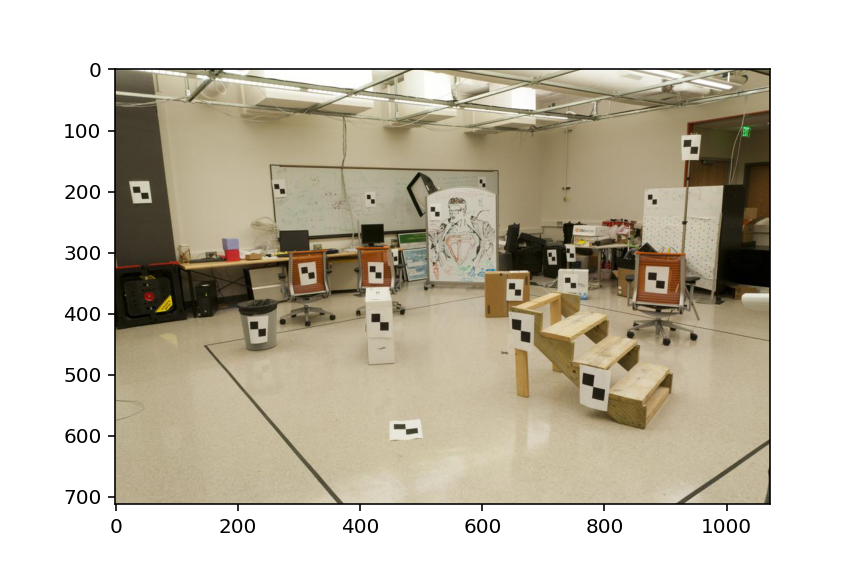

<IPython.core.display.Javascript object>


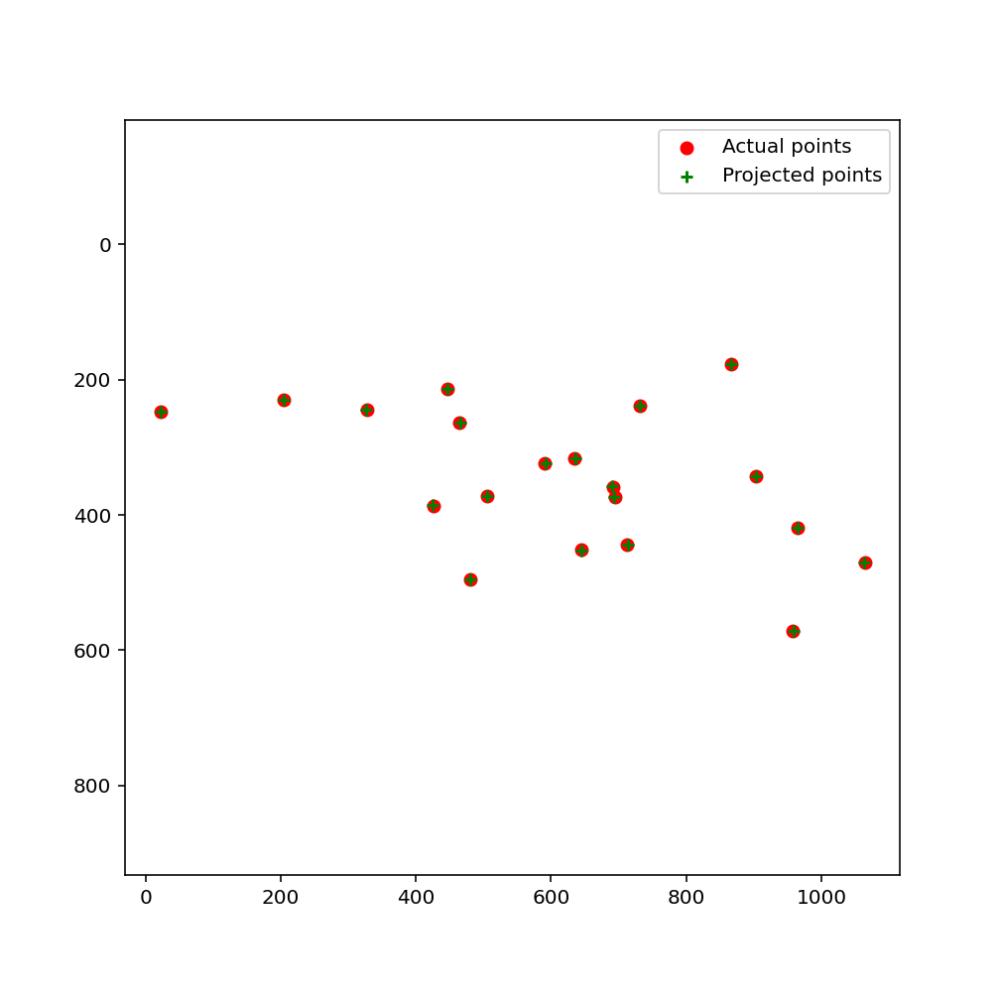

In [5]:
M = calculate_projection_matrix(points_2d, points_3d)
print('The projection matrix is\n', M)

[projected_2d_pts, residual] = evaluate_points(M, points_2d, points_3d);
print('The total residual is {:f}'.format(residual))
plt.figure(); plt.imshow(load_image(img_path))
visualize_points(points_2d, projected_2d_pts)

The estimated location of the camera is <303.0967, 307.1842, 30.4223>


<IPython.core.display.Javascript object>


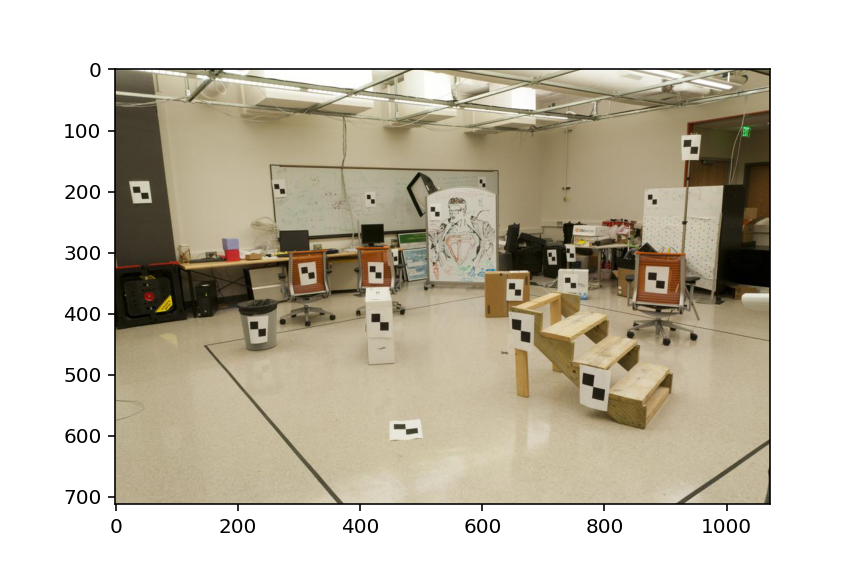

<IPython.core.display.Javascript object>


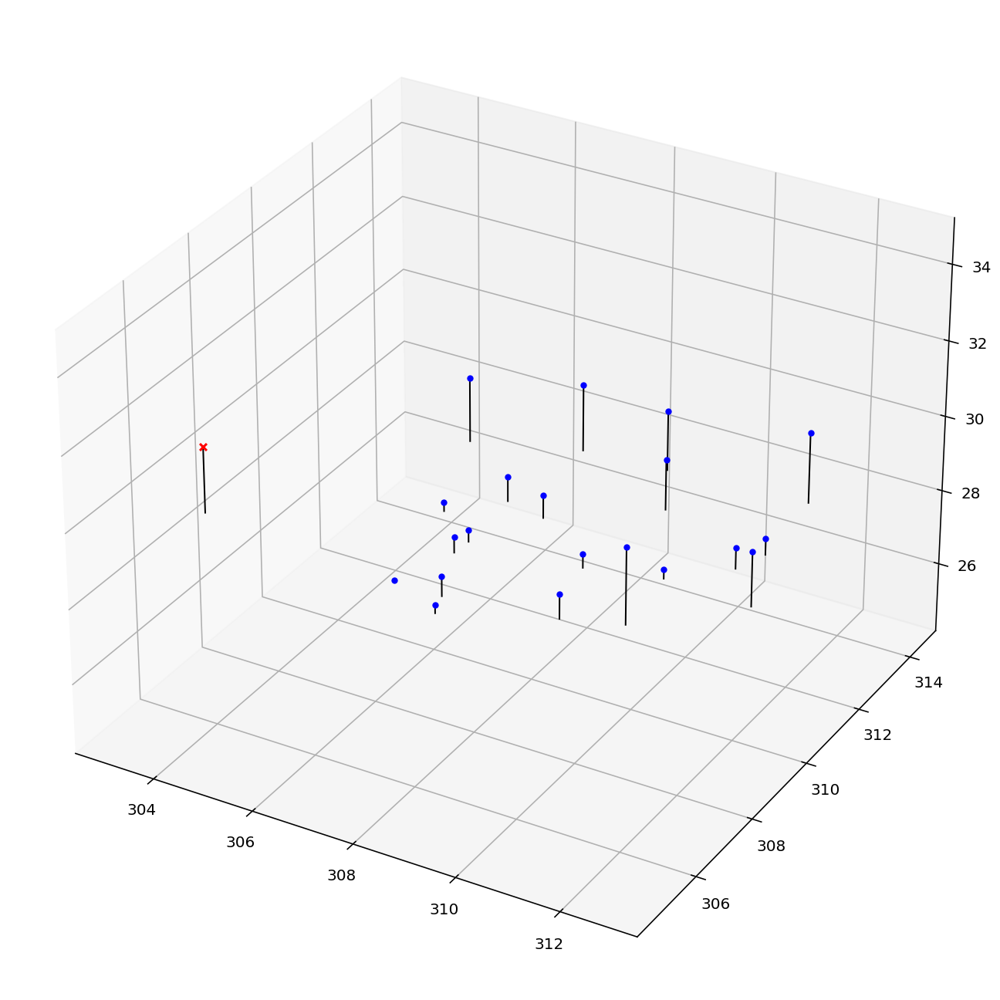

In [7]:
center = calculate_camera_center(M);
print('The estimated location of the camera is <{:.4f}, {:.4f}, {:.4f}>'.format(*center))
plt.figure(); plt.imshow(load_image(img_path))
ax = plot3dview(points_3d, center)

## Camera Calibration for Argoverse image data

Argoverse dataset is developed by Argo AI, in collaboration with faculty and students from Carnegie Mellon University and Georgia Institute of Technology. It is inspired by the [KITTI dataset](http://www.cvlibs.net/datasets/kitti/) and is a publicly available dataset for research into self-driving vehicle perception. The dataset contains high-quality curated data and detailed maps to improve 3D tracking and motion forecasting models. For more details on the Argoverse dataset, please look at this [link](https://www.argoverse.org/index.html). 

Using the codes that were implemented previously, we will estimate the position of a camera mounted on an autonomous vehicle in the Argoverse dataset. We'll use images from the "ring front center" camera, which faces the forward direction of the vehicle. The 3D and 2D point correspondences are given below. Two sample scenes have been provided below.

<img src="https://www.argoverse.org/assets/images/reference_images/O2V4_vehicle_annotation.jpg" alt="Drawing" style="width: 400px;"/>

In [9]:
# Argoverse Scene 2
#img_path = '../data/argoverse_log_d60558d2_pair2/pic2.jpg'
#points_2d = np.loadtxt('../data/argoverse_log_d60558d2_pair2/points_2d.txt')
#points_3d = np.loadtxt('../data/argoverse_log_d60558d2_pair2/points_3d.txt')


# Argoverse Scene 3
img_path = '../data/argoverse_log_d60558d2_pair3/pic3.jpg'
points_2d = np.loadtxt('../data/argoverse_log_d60558d2_pair3/points_2d.txt')
points_3d = np.loadtxt('../data/argoverse_log_d60558d2_pair3/points_3d.txt')

The projection matrix is
 [[-5.69544250e+02  8.49628922e+02  8.30195161e+00  9.44253377e+02]
 [-3.57429566e+02  2.96164295e+00  8.46650823e+02 -6.04042207e+02]
 [-6.04034739e-01  7.57864790e-03  7.05858919e-03  1.00000000e+00]]
The total residual is 0.000000


<IPython.core.display.Javascript object>


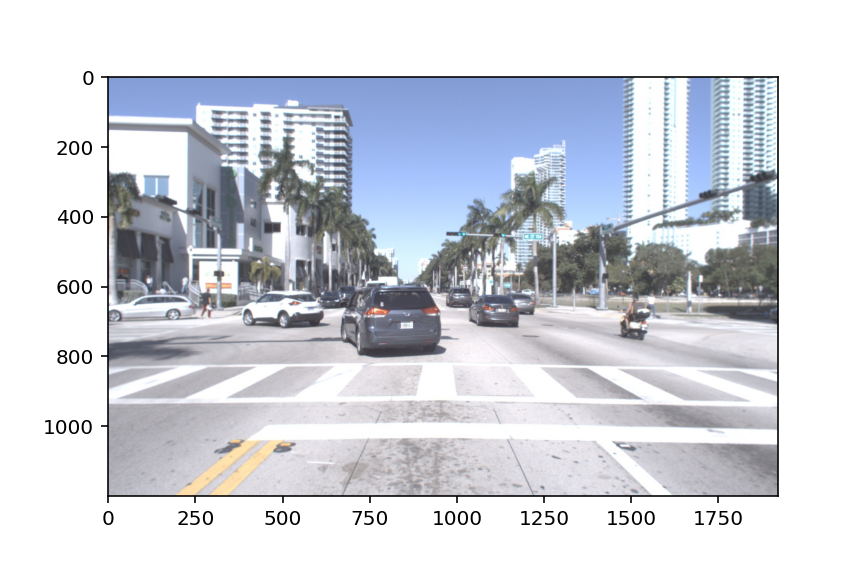

<IPython.core.display.Javascript object>


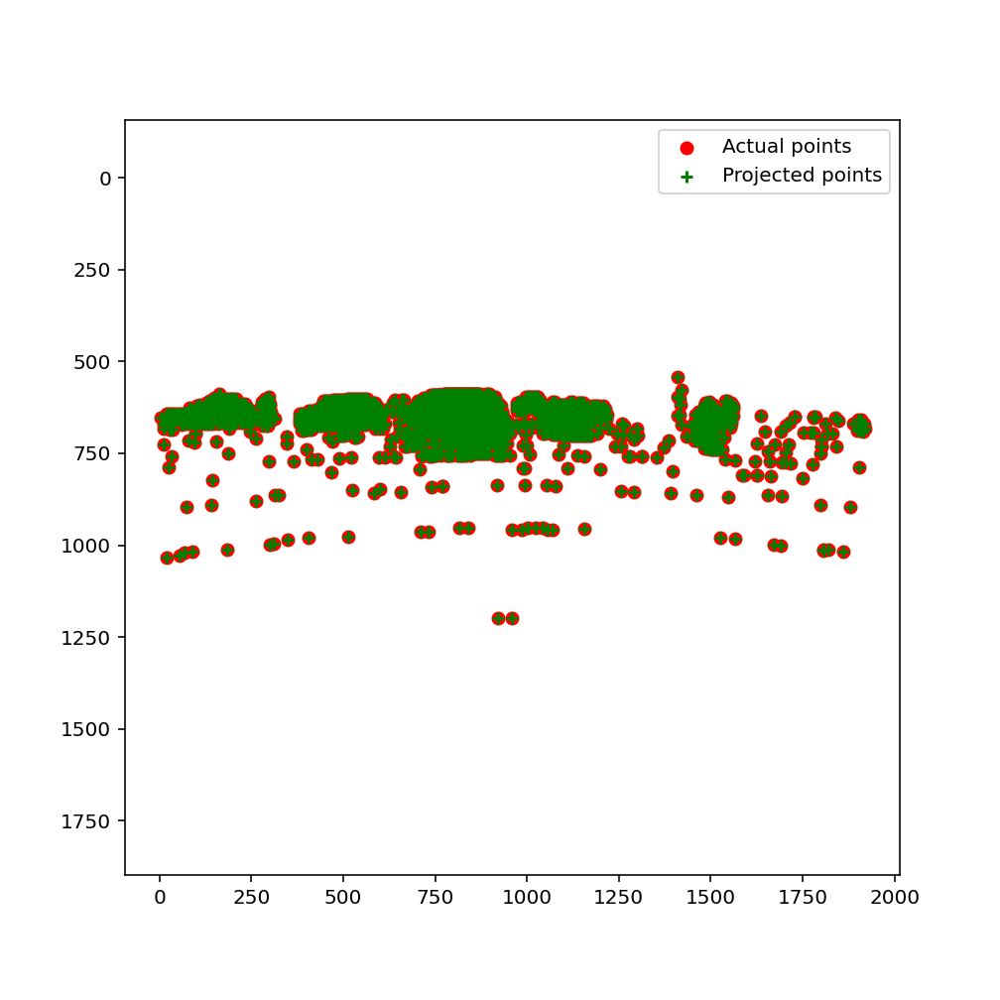

In [10]:
M = calculate_projection_matrix(points_2d, points_3d)
print('The projection matrix is\n', M)

[projected_2d_pts, residual] = evaluate_points(M, points_2d, points_3d);
print('The total residual is {:f}'.format(residual))
plt.figure(); plt.imshow(load_image(img_path))
visualize_points(points_2d, projected_2d_pts)

For these 2d-3d pairs, the "world" frame is defined as the "ego-vehicle" frame, where the origin is at the center of the back axle of the vehicle.

Thus, if your camera center estimate is correct, it should tell you how far to move forward (+x) and how far to move left (+y) and move up (+z) to reach the camera's position.


The "egovehicle" coordinate system and "camera" coordinate system:
<img width="300"  src="https://user-images.githubusercontent.com/16724970/108759169-034e6180-751a-11eb-8a06-fbe344f1ee68.png">
<img width="300" src="https://user-images.githubusercontent.com/16724970/108759182-06495200-751a-11eb-8162-8b17f9cdee4b.png">

The estimated location of the camera is <1.6721, -0.0044, 1.4194>


<IPython.core.display.Javascript object>


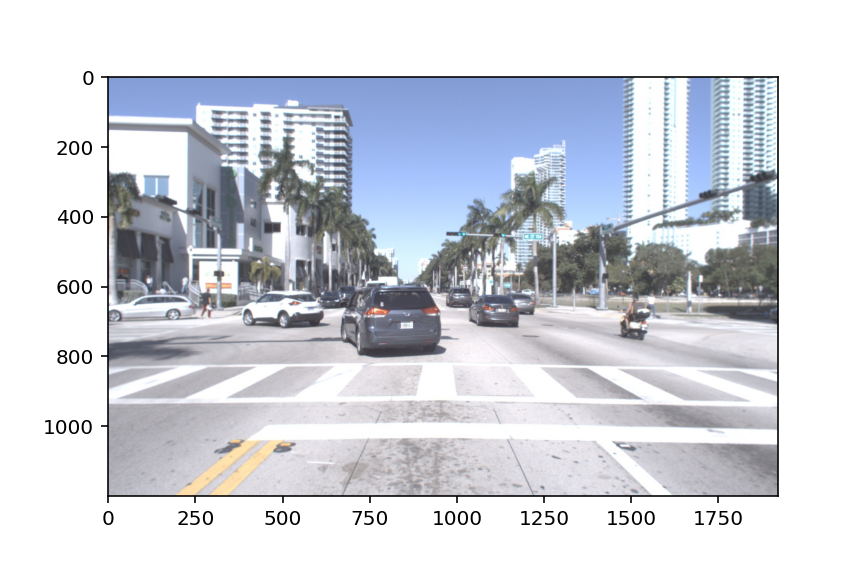

<IPython.core.display.Javascript object>


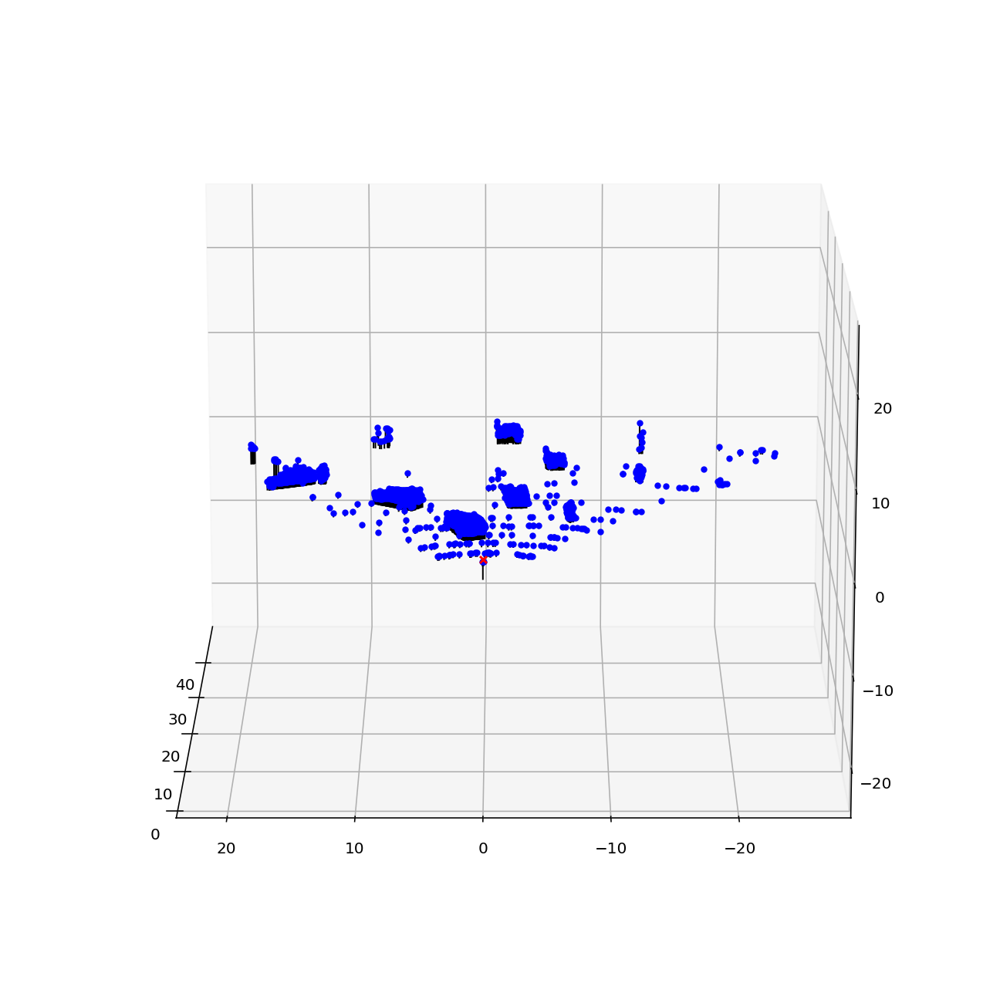

In [11]:
center = calculate_camera_center(M);
print('The estimated location of the camera is <{:.4f}, {:.4f}, {:.4f}>'.format(*center))
plt.figure(); plt.imshow(load_image(img_path))
ax = plot3dview(points_3d, center)
ax.view_init(elev=15, azim=180)

## Fundamental Matrix Estimation
We'll now solve for the Fundamental Matrix by implementing [Hartley's 8-Point algorithm](https://www.cse.unr.edu/~bebis/CS485/Handouts/hartley.pdf).

In this part of the project, we will estimate the mapping of points in one image to lines in another by
means of the fundamental matrix. This will require you to use similar methods to those in part 1. We will
make use of the corresponding point locations listed in pts2d-pic_a.txt and pts2d-pic_b.txt. Recall that
the definition of the fundamental matrix is

\begin{equation}
\left(\begin{array}{lll}
u^{\prime} & v^{\prime} & 1
\end{array}\right)\left(\begin{array}{lll}
f_{11} & f_{12} & f_{13} \\
f_{21} & f_{22} & f_{23} \\
f_{31} & f_{32} & f_{33}
\end{array}\right)\left(\begin{array}{l}
u \\
v \\
1
\end{array}\right)=0
\end{equation}

for a point $(u; v; 1)$ in image A, and a point $(u'; v'; 1)$ in image B.  Note: the fundamental matrix is sometimes defined as the transpose of the above matrix with the left and right image points swapped. Both are valid fundamental matrices, but the visualization functions in the starter code assume you use the above form. The above equation can also be written as:

\begin{equation}
\left(f_{11} u u^{\prime}+f_{12} v u^{\prime}+f_{13} u^{\prime}+f_{21} u v^{\prime}+f_{22} v v^{\prime}+f_{23} v^{\prime}+f_{31} u+f_{32} v+f_{33}\right)=0
\end{equation}

Given corresponding points, you get one equation per point pair. With 8 or more points you can solve this (why 8?). Similar to part 1, there’s an issue here where the matrix is only defined up to scale and the degenerate zero solution solves these equations. So you need to solve using the same method you used in part 1 of first fixing the scale and then solving the regression.

In [12]:
from calibration import estimate_fundamental_matrix

In [13]:
# Load the data
points_2d_pic_a = np.loadtxt('../data/CCB/pts2d-pic_a.txt')
points_2d_pic_b = np.loadtxt('../data/CCB/pts2d-pic_b.txt')
img_a = load_image('../data/CCB/pic_a.jpg')
img_b = load_image('../data/CCB/pic_b.jpg')

### Estimate fundamental matrix

<IPython.core.display.Javascript object>


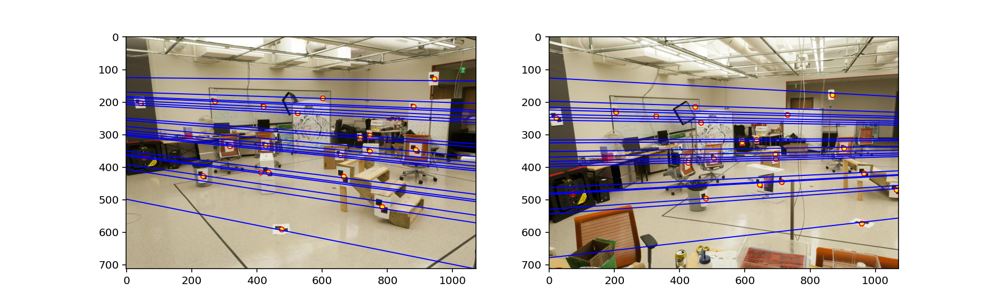

In [15]:
F = estimate_fundamental_matrix(points_2d_pic_a, points_2d_pic_b)

# Draw epipolar lines using the fundamental matrix
draw_epipolar_lines(F, img_a, img_b, points_2d_pic_a, points_2d_pic_b, figsize=(13,4))

## Fundamental Matrix with RANSAC (Szeliski 6.1.4)

Now we are going to compute the fundamental matrix with point correspondences computed using SIFT. Least squares regression alone is not appropriate in this scenario due to the presence of multiple outliers. To estimate the fundamental matrix from this noisy data you’ll need to use RANSAC in conjunction with the fundamental matrix estimation.

## Visualization of Fundamental Matrix



In [16]:
from calibration import calculate_num_ransac_iterations, ransac_fundamental_matrix, compute_fundamental_matrix_ransac

### Compute matches and Fundamental Matrix for Each Pair

Now use the `compute_fundamental_matrix_ransac` function to generate the visualizations for all the pairs of images described above. We have already described a sample function call for one of the pairs of images. Modify the parameters appropriately to get the results for other pairs of images.

In [17]:
match_image, match_image_ransac, _, _, matched_points_ransac_a, matched_points_ransac_b, pic_a, pic_b, F_wo_ransac, F_ransac = compute_fundamental_matrix_ransac(
    img1_path='../data/Woodruff_Dorm/wood1.jpg', 
    img2_path='../data/Woodruff_Dorm/wood2.jpg', 
    img1_scale=0.65, 
    img2_scale=0.65, 
    num_features=5e4
)

Now that you have matched points with and without RANSAC, plot both of them below and answer the reflection questions in the report.

<IPython.core.display.Javascript object>


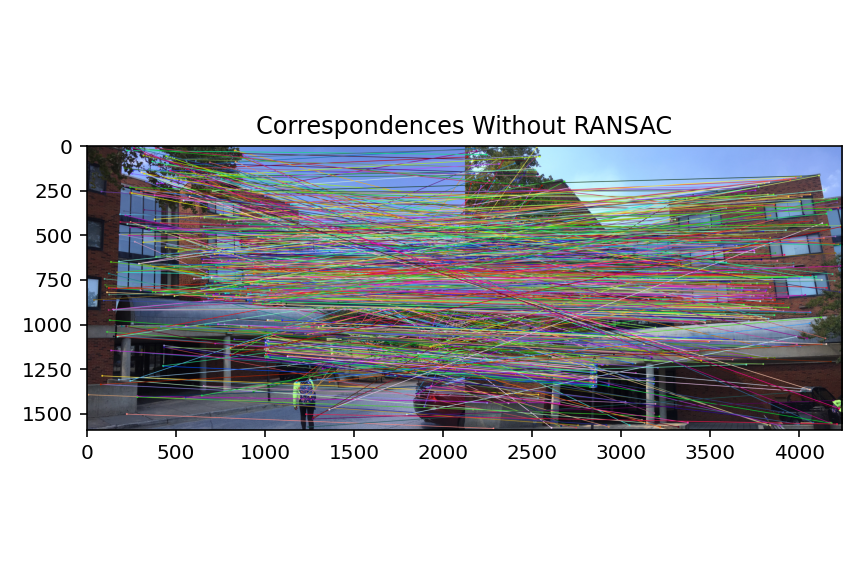

In [18]:
plt.figure()
plt.title("Correspondences Without RANSAC")
plt.imshow(match_image)
plt.tight_layout()

<IPython.core.display.Javascript object>


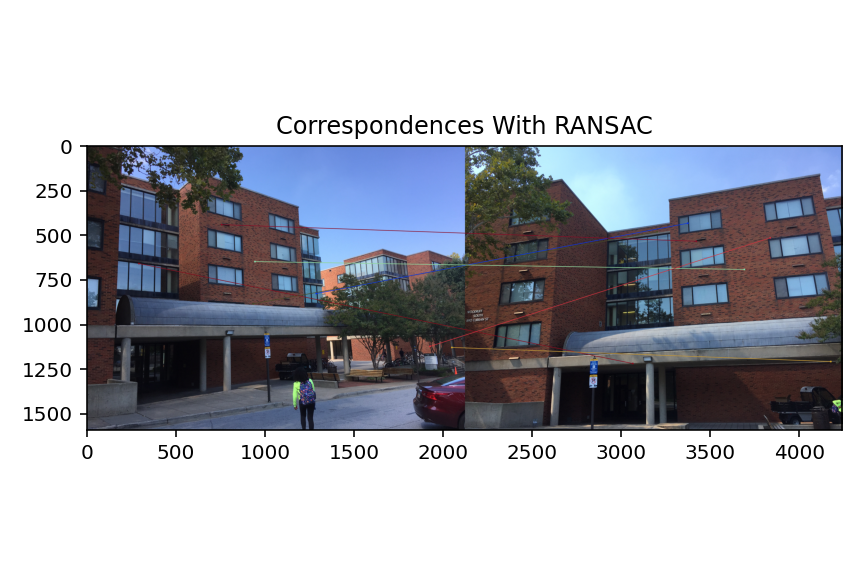

In [19]:
plt.figure()
plt.title("Correspondences With RANSAC")
plt.imshow(match_image_ransac)
plt.tight_layout()

Now, we can visualize the epipolar lines for our estimated fundamental matrix using the helper function `draw_epipolar_lines`.

<IPython.core.display.Javascript object>


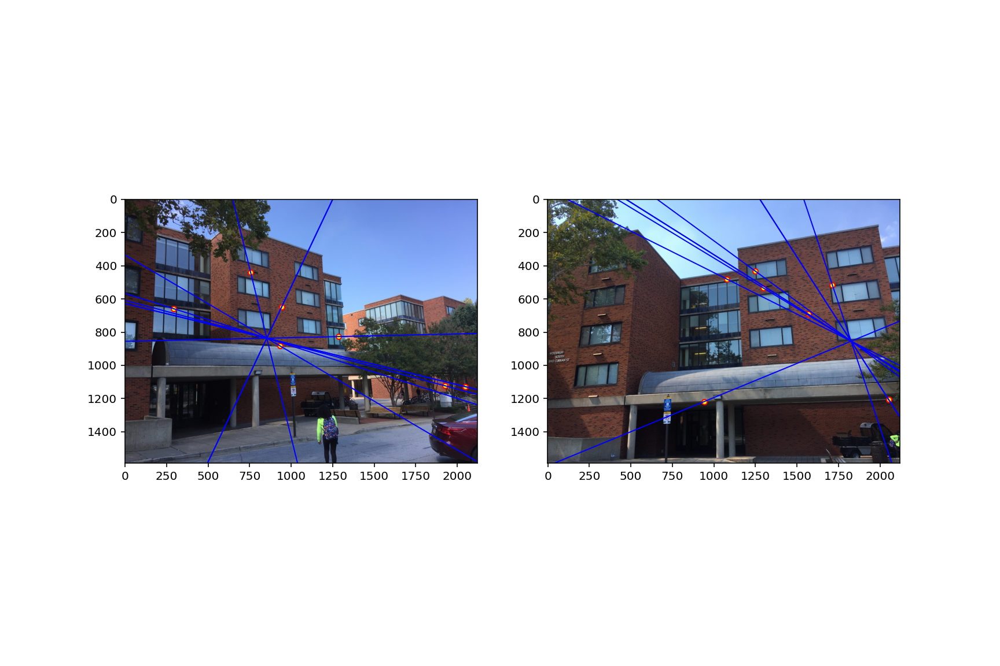

In [20]:
draw_epipolar_lines(F_ransac, pic_a, pic_b, matched_points_ransac_a, matched_points_ransac_b, figsize=(12,8))

## Comparison of the results

#### Performance Comparison on Argoverse

We'll now test the quality of Fundamental matrices we can compute with and without RANSAC on an image pair from the [Argoverse](https://www.argoverse.org/) autonomous driving dataset. In this part, we will compare the performance of using the direct least squares method against RANSAC.

In [21]:
argo_match_image, argo_match_image_ransac, argo_matched_points_wo_ransac_a, argo_matched_points_wo_ransac_b, argo_matched_points_a, argo_matched_points_b, argo_a, argo_b, argo_F_wo_ransac, argo_F_ransac = compute_fundamental_matrix_ransac(
    img1_path='../data/argoverse_log_273c1883/ring_front_center_315975640448534784.jpg', 
    img2_path='../data/argoverse_log_273c1883/ring_front_center_315975643412234000.jpg', 
    img1_scale=0.5, 
    img2_scale=0.5, 
    num_features=4e3
)

We first plot the matches that we get using our utlities function `get_matches`. 

<IPython.core.display.Javascript object>


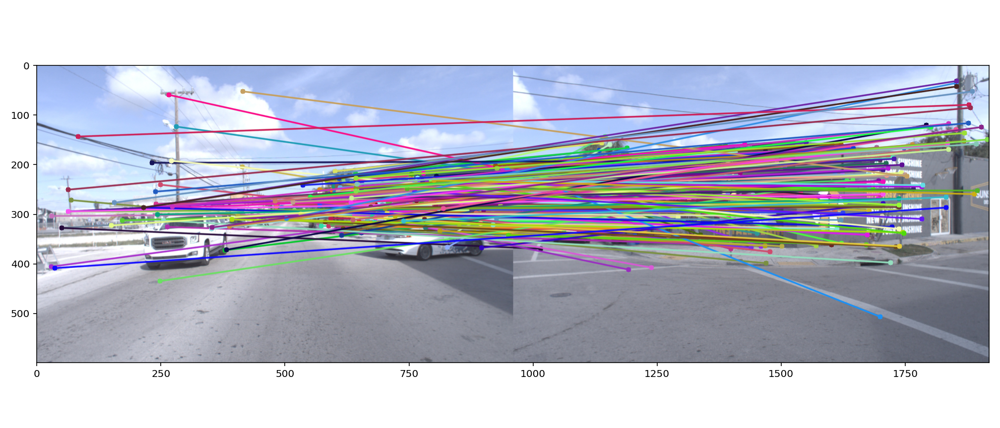

In [22]:
plt.figure(figsize=(14,6))
plt.imshow(argo_match_image)
plt.tight_layout()

### Without RANSAC Estimation
If we ignore RANSAC and use only our implementation from Part2, we get the following results:

<IPython.core.display.Javascript object>


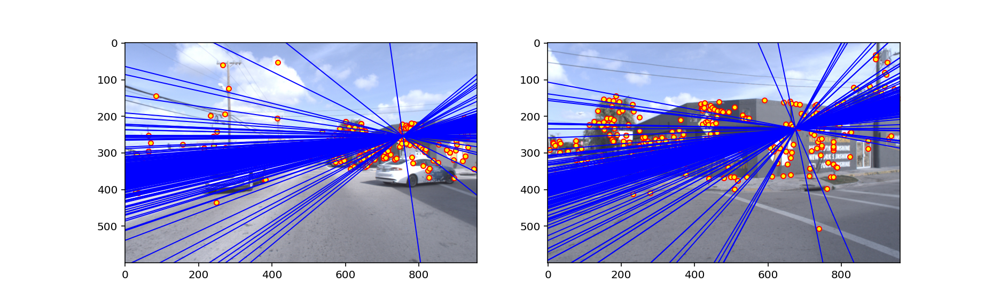

In [23]:
draw_epipolar_lines(argo_F_wo_ransac, argo_a, argo_b, argo_matched_points_wo_ransac_a, argo_matched_points_wo_ransac_b, figsize=(13,4))

### With Ransac Estimation
Now we'll use our RANSAC implementation from Part 3. The camera is mounted on an autonomous vehicle identical to the vehicle seen up ahead in the left image.

<IPython.core.display.Javascript object>


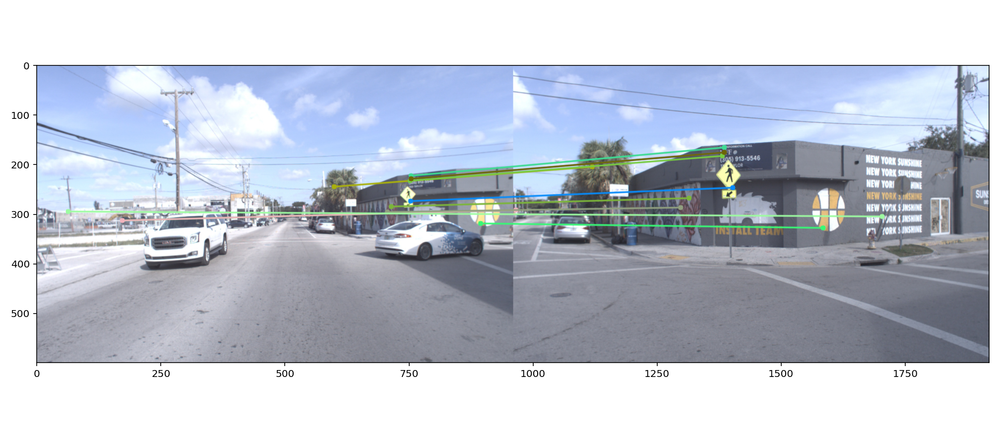

In [24]:
plt.figure(figsize=(14,6))
plt.imshow(argo_match_image_ransac)
plt.tight_layout()

Visualizing the epipolar lines for the fundamental matrix computed using RANSAC. 

<IPython.core.display.Javascript object>


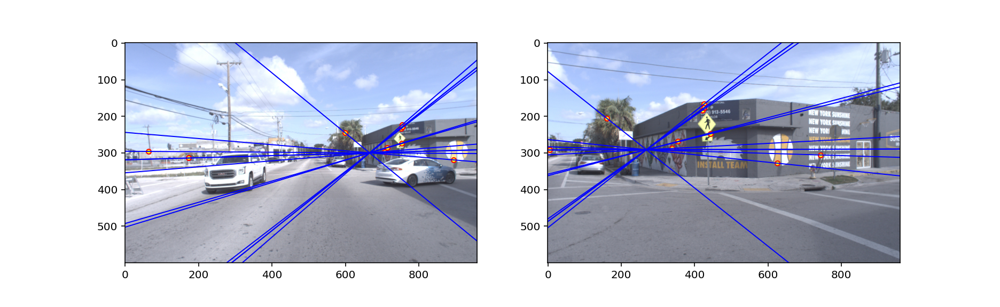

In [25]:
draw_epipolar_lines(argo_F_ransac, argo_a, argo_b, argo_matched_points_a, argo_matched_points_b, figsize=(13,4))

## Visual Odometry

Visual odometry (VO) is an important part of the simultaneous localization and mapping (SLAM) problem.
In this part, you will write code to implement VO on a real-world example from Argoverse. VO will
allow us to recreate most of the ego-motion of a camera mounted on a robot - the relative translation (but
only up to an unknown scale), and the relative rotation. See this [tutorial](https://ieeexplore.ieee.org/document/6096039) for a more detailed understanding. 

In [26]:
from calibration import get_visual_odometry, plot_poses, compute_absolute_poses

For the following gif, we try to obtain the visual odometry of a camera mounted on a robot from the individual image frames.

![VO](https://user-images.githubusercontent.com/16724970/100487935-34fd8b00-30d9-11eb-9941-7735fcae445c.gif "VO")

In [27]:
# This may take a few minutes to run across 20 image frames from the Argoverse dataset
image_frames_path = os.path.join("..", "data", "vo_seq_argoverse_273c1883", "ring_front_center")
poses_relative = get_visual_odometry(image_frames_path)

Rotation about y-axis from frame 0 -> 1: 0.30 degrees
Rotation about y-axis from frame 1 -> 2: 0.39 degrees
Rotation about y-axis from frame 2 -> 3: 0.54 degrees
Rotation about y-axis from frame 3 -> 4: 0.92 degrees
Rotation about y-axis from frame 4 -> 5: 1.47 degrees
Rotation about y-axis from frame 5 -> 6: 2.20 degrees
Rotation about y-axis from frame 6 -> 7: 3.56 degrees
Rotation about y-axis from frame 7 -> 8: 5.90 degrees
Rotation about y-axis from frame 8 -> 9: 7.55 degrees
Rotation about y-axis from frame 9 -> 10: 8.50 degrees
Rotation about y-axis from frame 10 -> 11: 9.98 degrees
Rotation about y-axis from frame 11 -> 12: 10.98 degrees
Rotation about y-axis from frame 12 -> 13: 11.18 degrees
Rotation about y-axis from frame 13 -> 14: 10.66 degrees
Rotation about y-axis from frame 14 -> 15: 8.95 degrees
Rotation about y-axis from frame 15 -> 16: 6.35 degrees
Rotation about y-axis from frame 16 -> 17: 3.25 degrees
Rotation about y-axis from frame 17 -> 18: 0.97 degrees
Rotation

In [28]:
poses_absolute = compute_absolute_poses(poses_relative)

<IPython.core.display.Javascript object>


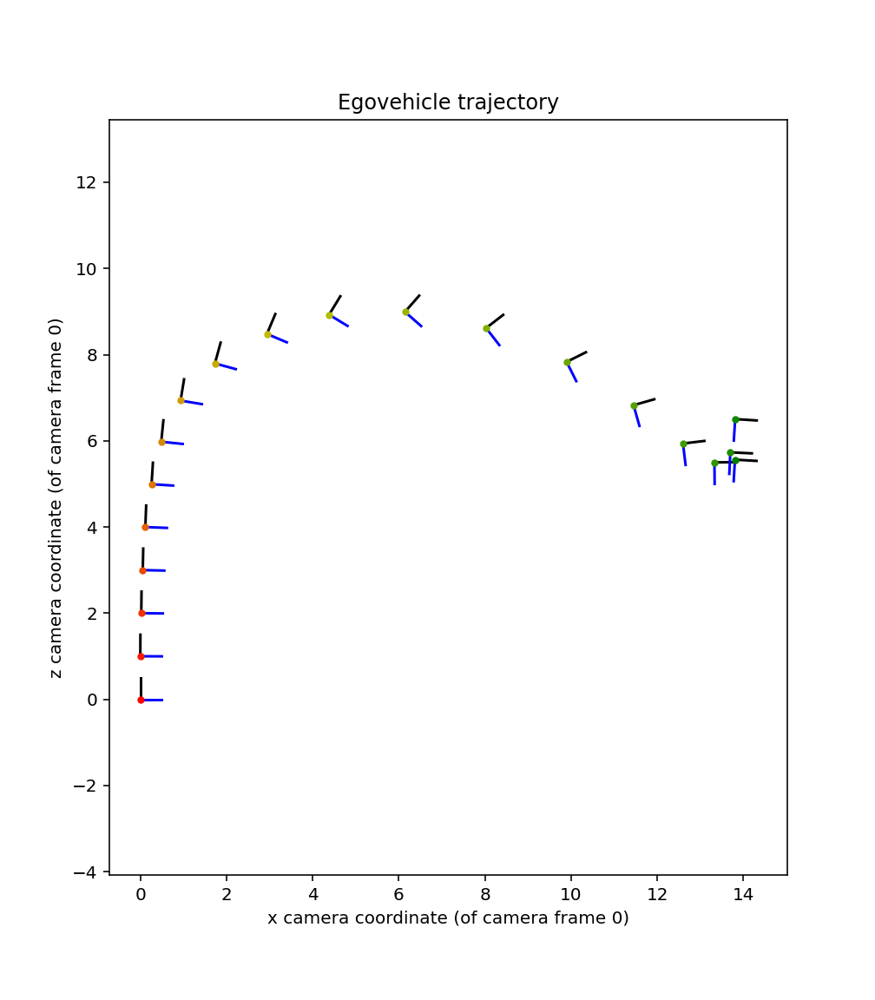

/Applications/miniconda3/envs/cv_proj5/lib/python3.6/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [30]:
plot_poses(poses_absolute)